In [1]:
from wordcloud import WordCloud
import pandas as pd
import datetime as dt
import dateutil
import re
import matplotlib.pyplot as plt

In [2]:
youtube = pd.read_csv('../data/youtube.csv', sep=';', decimal=',', index_col = 0)
youtube.head()

,titleUrl,time,type,content
0,https://www.youtube.com/results?search_query=t...,2014-08-13 09:04:48.899000+02:00,Searched,trailers 2014 movies official
1,https://www.youtube.com/results?search_query=t...,2014-08-13 09:07:25.758000+02:00,Searched,the avengers 2
2,https://www.youtube.com/results?search_query=h...,2014-08-13 13:39:43.783000+02:00,Searched,how to train your dragon 2
3,https://www.youtube.com/results?search_query=t...,2014-08-14 08:34:37.200000+02:00,Searched,tricicle sit
4,https://www.youtube.com/results?search_query=t...,2014-08-14 08:57:49.271000+02:00,Searched,tricicle bits


In [3]:
youtube = youtube[youtube['type'] == 'Watched'].reset_index(drop=True)

In [4]:
def iterator_year_month(start_month,start_year,end_month,end_year):
    ym_start= 12*start_year + start_month - 1
    ym_end= 12*end_year + end_month - 1
    for ym in range(ym_start, ym_end +1 ):
        y, m = divmod( ym, 12 )
        if m + 1 < 10:
            yield str(y),'0'+str(m+1)
        else:
            yield str(y), str(m+1)

In [5]:
[x for x in iterator_year_month(10,2017,7,2020)]

[('2017', '10'),
 ('2017', '11'),
 ('2017', '12'),
 ('2018', '01'),
 ('2018', '02'),
 ('2018', '03'),
 ('2018', '04'),
 ('2018', '05'),
 ('2018', '06'),
 ('2018', '07'),
 ('2018', '08'),
 ('2018', '09'),
 ('2018', '10'),
 ('2018', '11'),
 ('2018', '12'),
 ('2019', '01'),
 ('2019', '02'),
 ('2019', '03'),
 ('2019', '04'),
 ('2019', '05'),
 ('2019', '06'),
 ('2019', '07'),
 ('2019', '08'),
 ('2019', '09'),
 ('2019', '10'),
 ('2019', '11'),
 ('2019', '12'),
 ('2020', '01'),
 ('2020', '02'),
 ('2020', '03'),
 ('2020', '04'),
 ('2020', '05'),
 ('2020', '06'),
 ('2020', '07')]

In [6]:
youtube['time'].apply(lambda x: re.findall(r'^(\d+)-(\d+)', x)[0])


0        (2016, 01)
1        (2016, 01)
2        (2016, 01)
3        (2016, 01)
4        (2016, 01)
            ...    
19599    (2020, 07)
19600    (2020, 07)
19601    (2020, 07)
19602    (2020, 07)
19603    (2020, 07)
Name: time, Length: 19604, dtype: object

In [7]:
youtube[youtube['time'].apply(lambda x: re.findall(r'^(\d+)-(\d+)', x)[0])==(str(2018),'0' + str(1))]

,titleUrl,time,type,content
7000,https://www.youtube.com/watch?v=Qgur9SMS76w,2018-01-02 17:18:39.675000+01:00,Watched,Ed Sheeran - Perfect | Piano Cover by Yuval Sa...
7001,https://www.youtube.com/watch?v=RW-4Y80q-bo,2018-01-03 16:35:22.566000+01:00,Watched,Ed Sheeran – Perfect with Jools Holland & His ...
7002,https://www.youtube.com/watch?v=8hCIcFSm85E,2018-01-03 16:58:26.402000+01:00,Watched,Nuestros juegos españoles favoritos 2017
7003,https://www.youtube.com/watch?v=l15cl7OKklU,2018-01-03 17:33:53.175000+01:00,Watched,Cosmogenesis - Ludonova — Videoreseña
7004,https://www.youtube.com/watch?v=DqMGCTF5ZLE,2018-01-03 17:33:59.535000+01:00,Watched,Cosmogénesis - ¿Funciona a dos? - Ludonova
...,...,...,...,...
7311,https://www.youtube.com/watch?v=geurXLWFsNw,2018-01-31 18:30:10.584000+01:00,Watched,Top 10 Games of 2017!
7312,https://www.youtube.com/watch?v=d_CboZoxvvk,2018-01-31 18:32:57.497000+01:00,Watched,Top 10 Must Have Solo Games of 2017!
7313,https://www.youtube.com/watch?v=_HY6NatvBuY,2018-01-31 18:38:11.518000+01:00,Watched,"Los MEJORES juegos para ""perder amigos"""
7314,https://www.youtube.com/watch?v=1-Np7sF0Y1U,2018-01-31 19:30:27.348000+01:00,Watched,TimeBomb - Tutorial


In [8]:
[content for content in youtube[youtube['time'].apply(lambda x: re.findall(r'^(\d+)-(\d+)', x)[0])==('2018','01')]['content']]

['Ed Sheeran - Perfect | Piano Cover by Yuval Salomon',
 'Ed Sheeran – Perfect with Jools Holland & His Rhythm & Blues Orchestra',
 'Nuestros juegos españoles favoritos 2017',
 'Cosmogenesis - Ludonova — Videoreseña',
 'Cosmogénesis - ¿Funciona a dos? - Ludonova',
 'Colonos del Imperio VS 51st State Set Completo - ¿Cuál es mejor?',
 'Especial: Juegos introductorios por categorías',
 'Top 10 de nuestros juegos favoritos — Pablo',
 'Telón de Acero - Ludonova — Videoreseña',
 'Junk Art - Ludonova — Videoreseña',
 'Space Opera - Games 4 Gamers — Videoreseña',
 'Top 10 de juegos sobre ciudades',
 'Century - Devir — Videoreseña (con Rincón de Jugones)',
 'Russian Railroads - Devir — Videoreseña',
 'Los Inseparables - Ludonova — Videoreseña',
 'El Gran Libro de la Locura - Devir — Videoreseña',
 'Los Inseparables - Juego de Mesa - Gameplay',
 'LOS INSEPARABLES PARTIDA',
 'Los Inseparables: Partida',
 'Cómo jugar a Los Inseparables, Explicación y Partida (ESPAÑOL) Juego de Mesa -Games On Board

10-2017



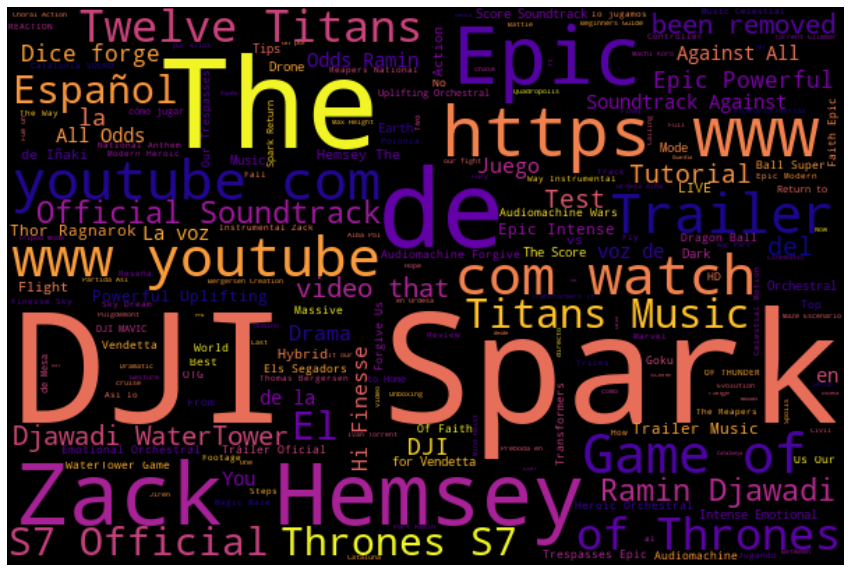



11-2017



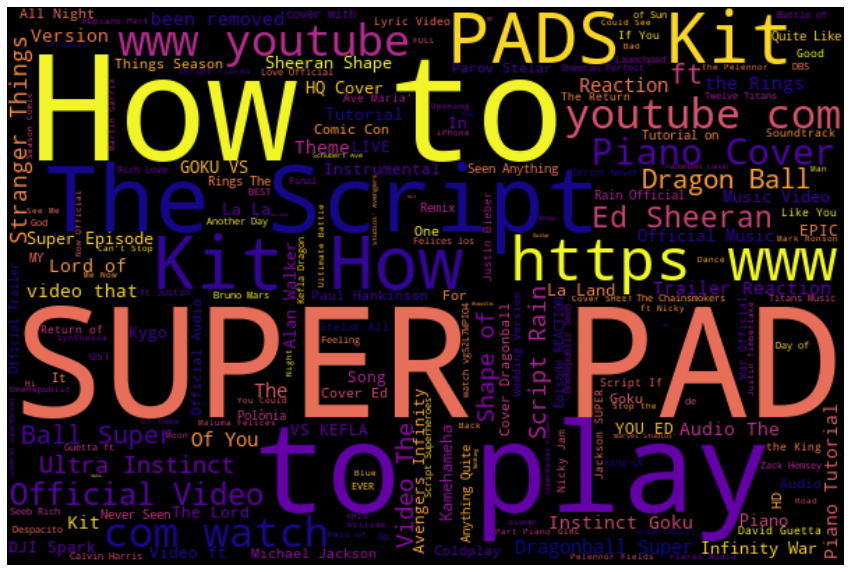



12-2017



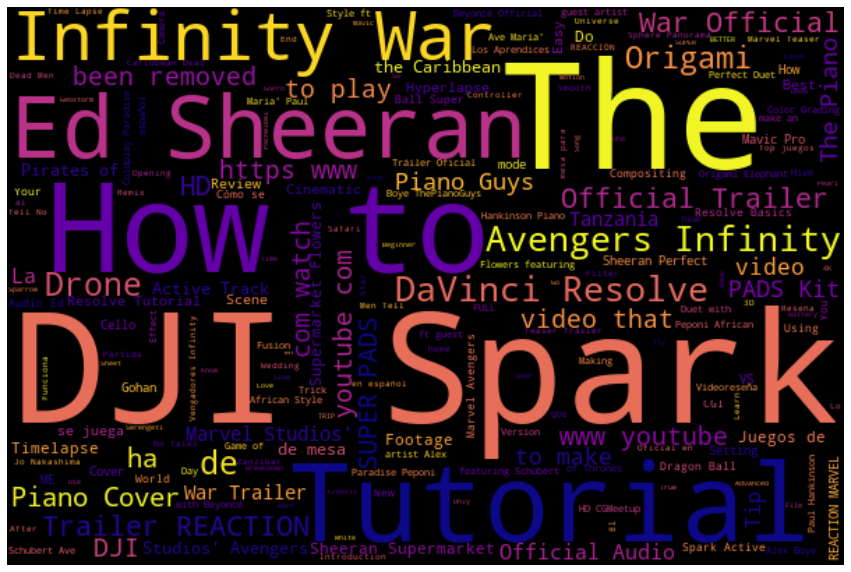



01-2018



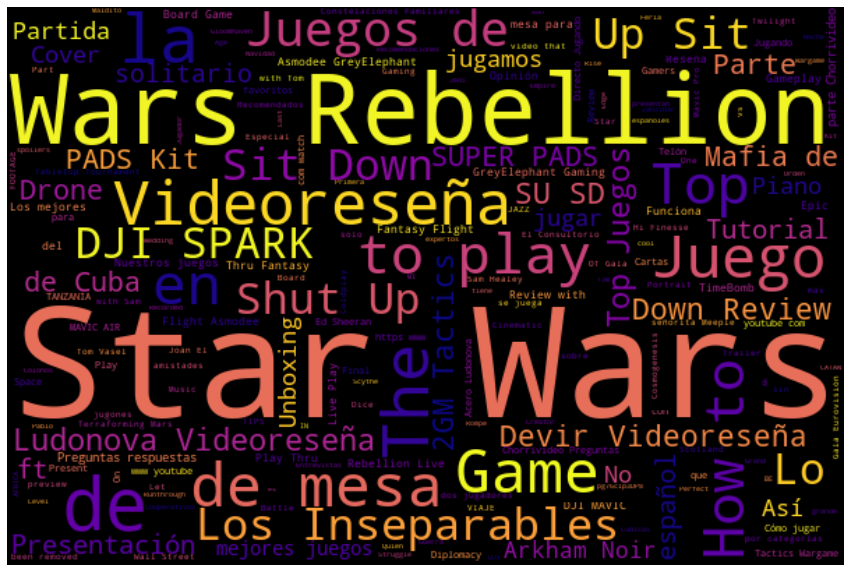



02-2018



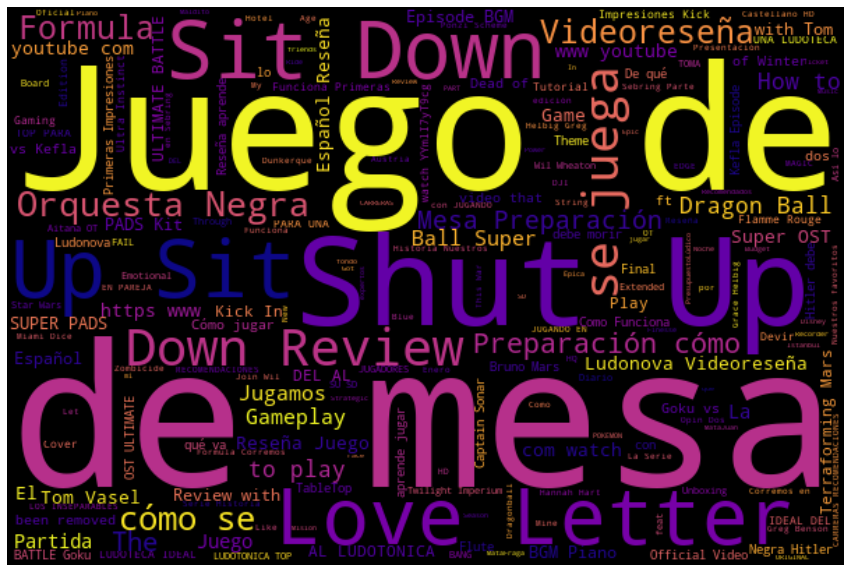



03-2018



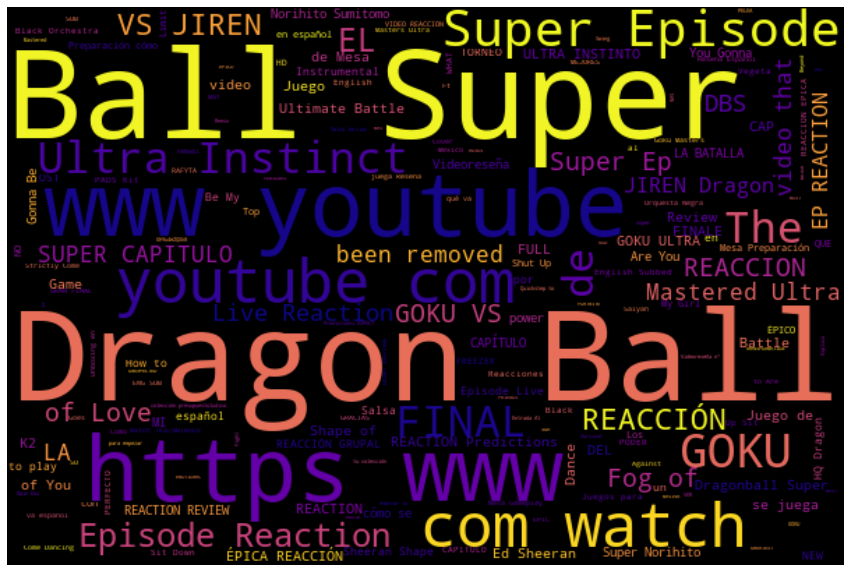



04-2018



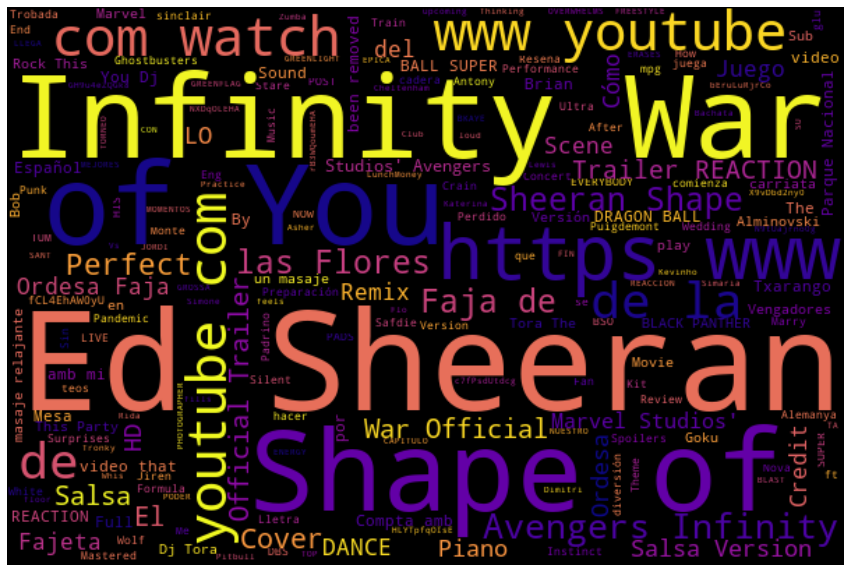



05-2018



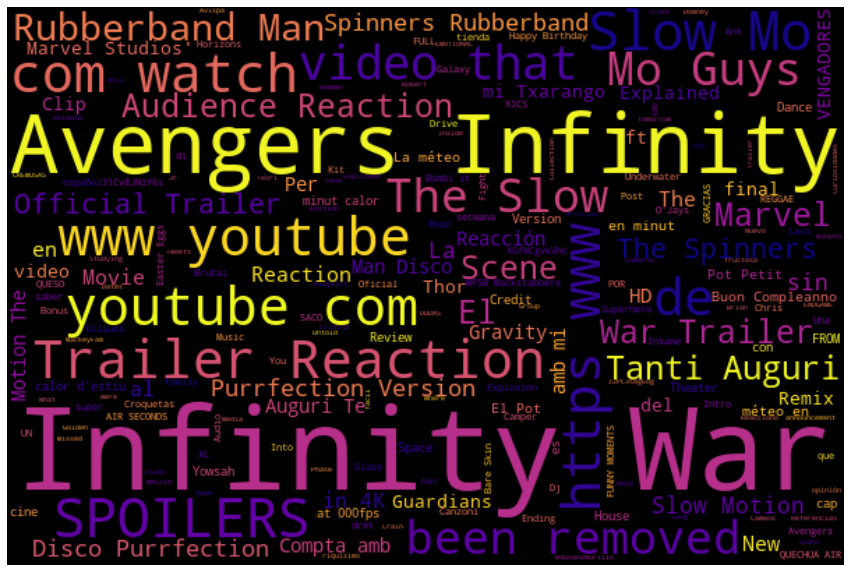



06-2018



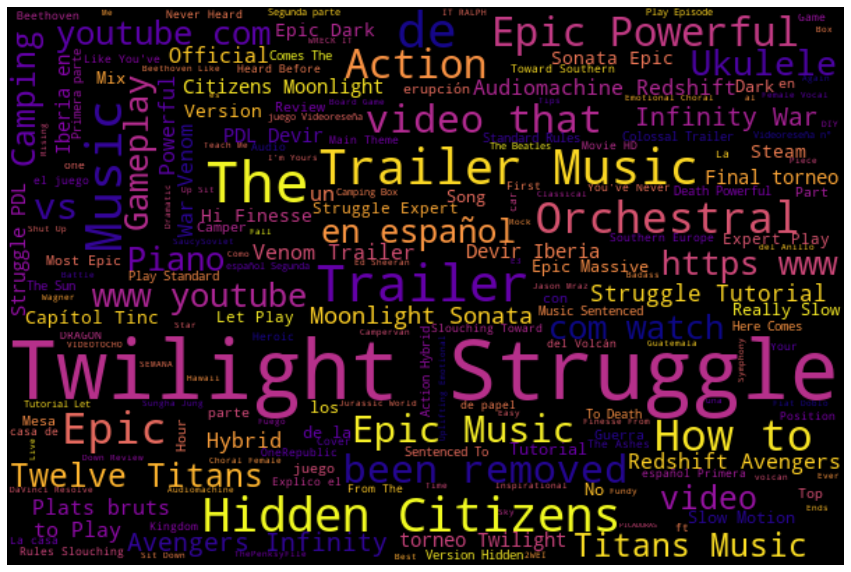



07-2018



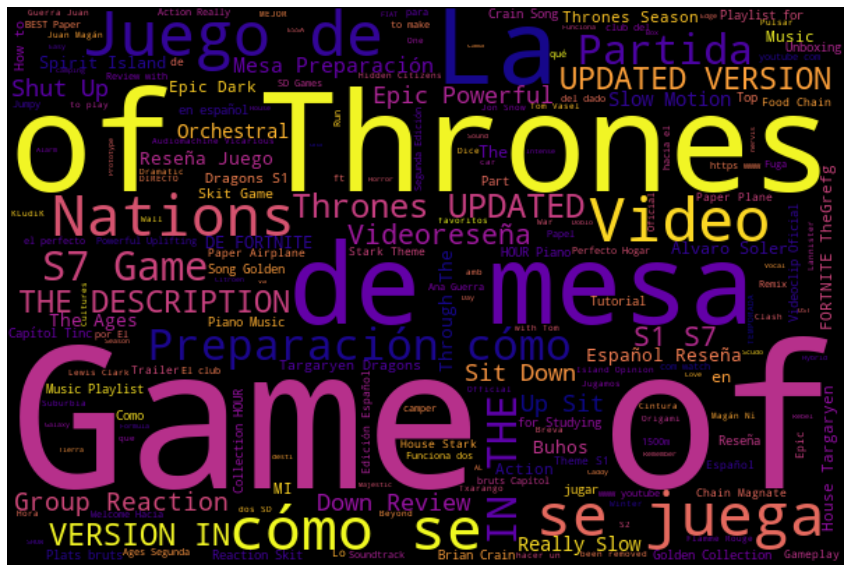



08-2018



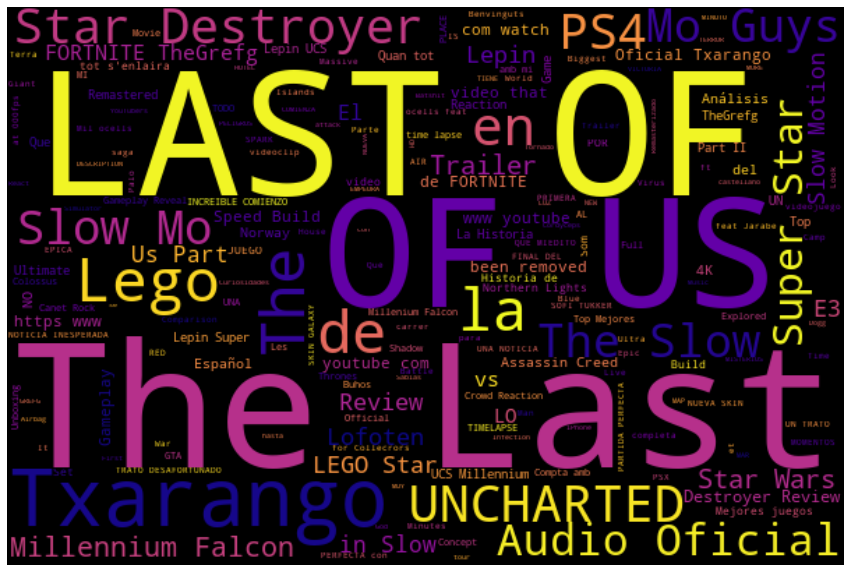



09-2018



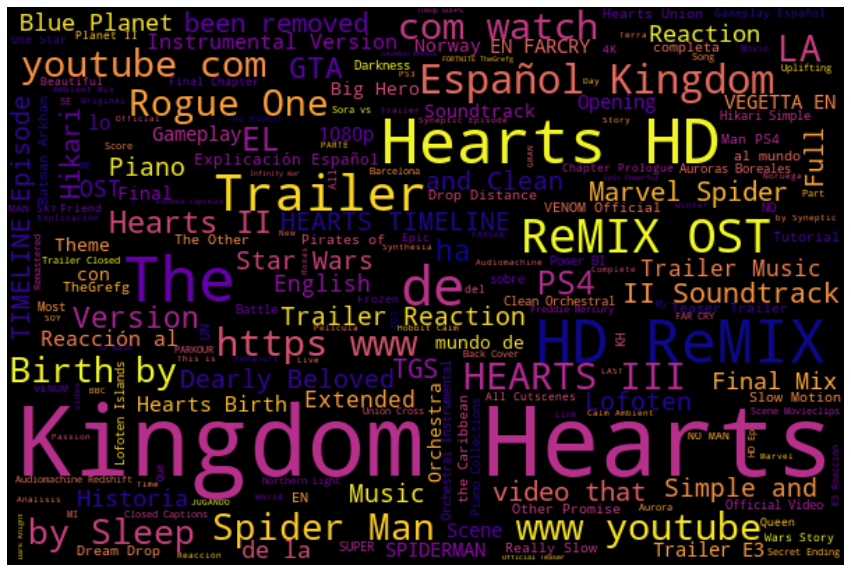



10-2018



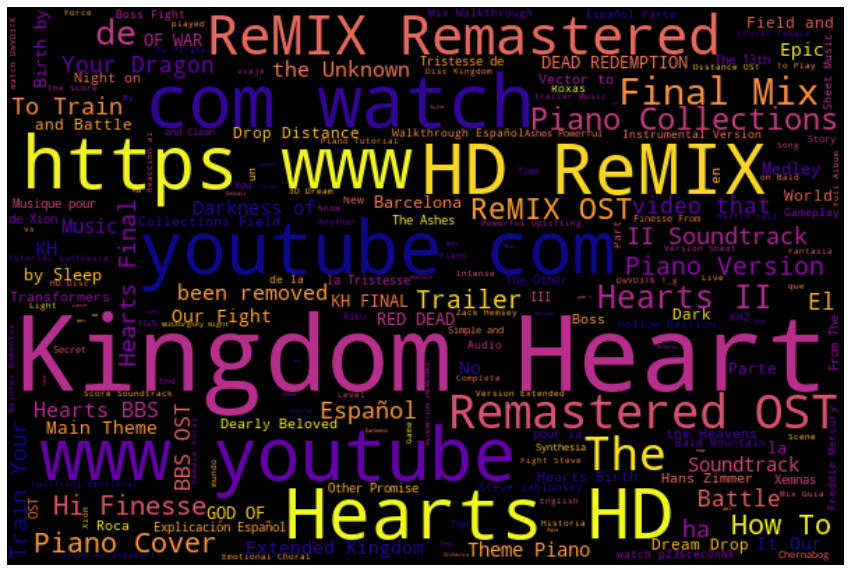



11-2018



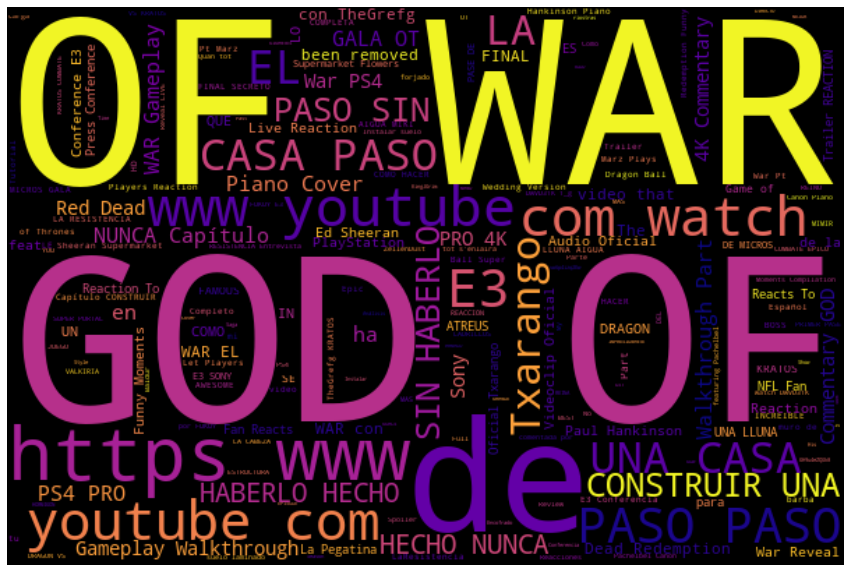



12-2018



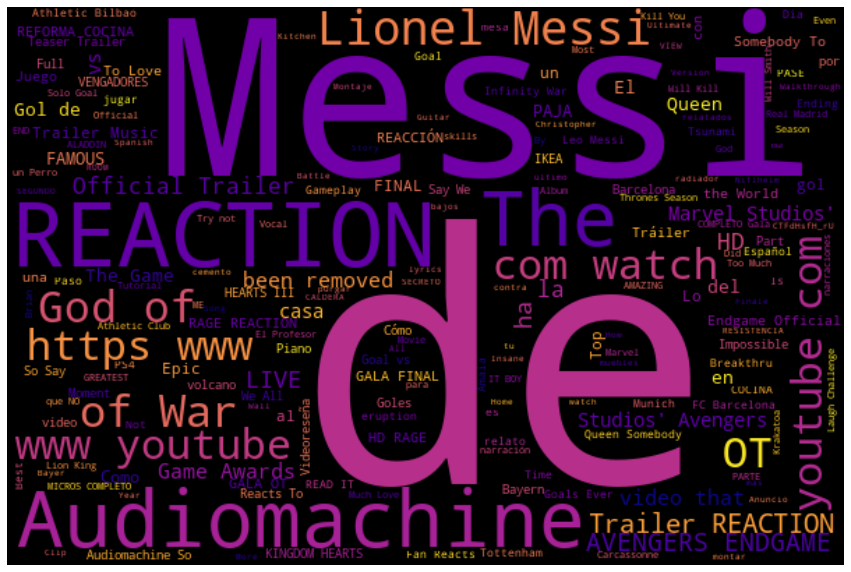



01-2019



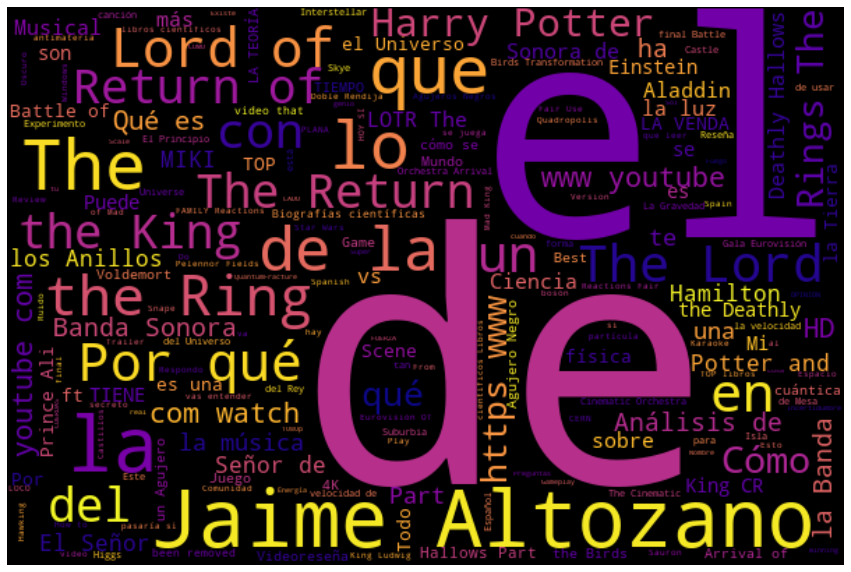



02-2019



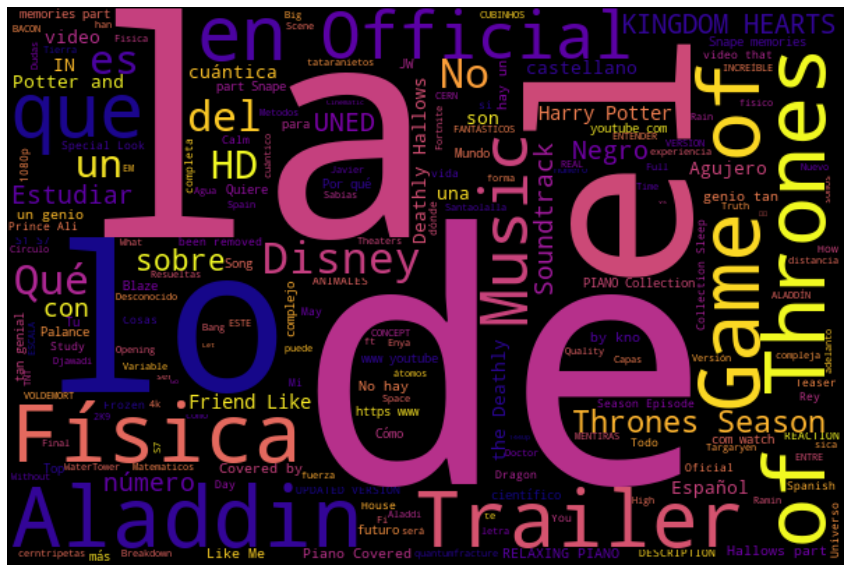



03-2019



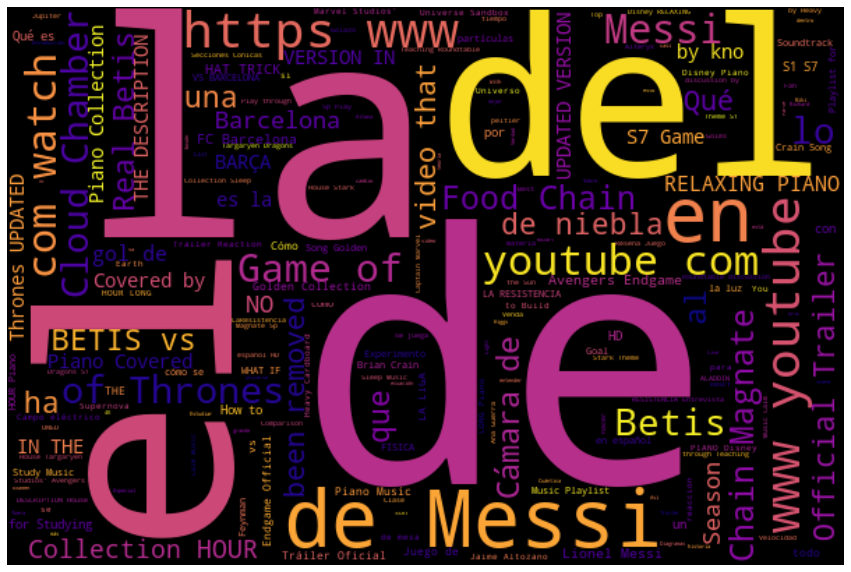



04-2019



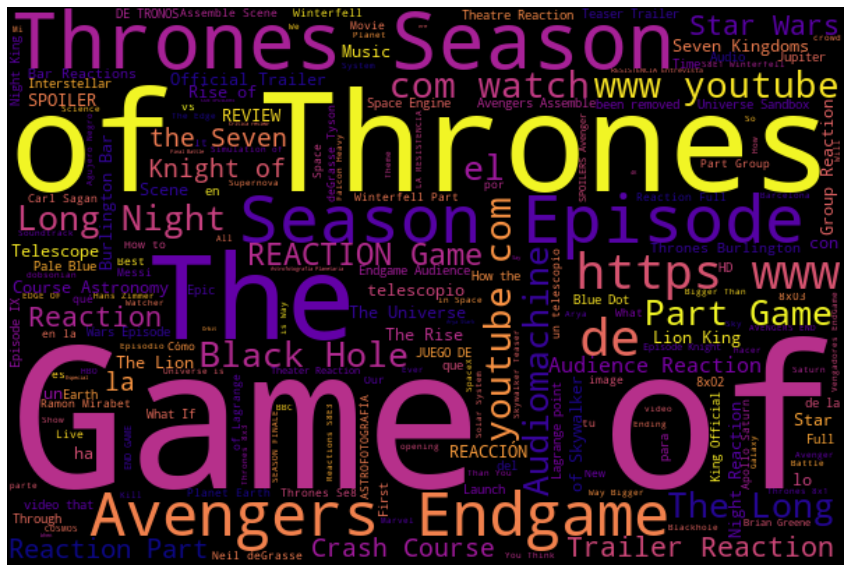



05-2019



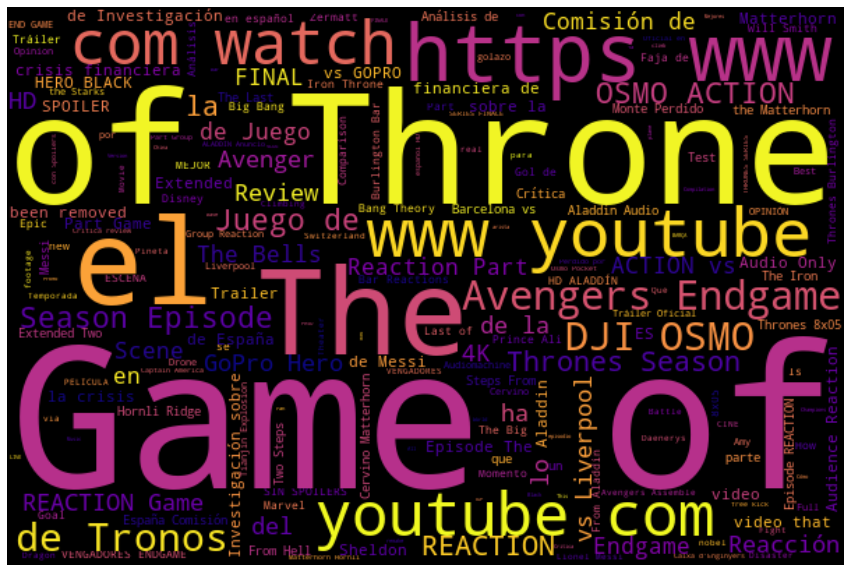



06-2019



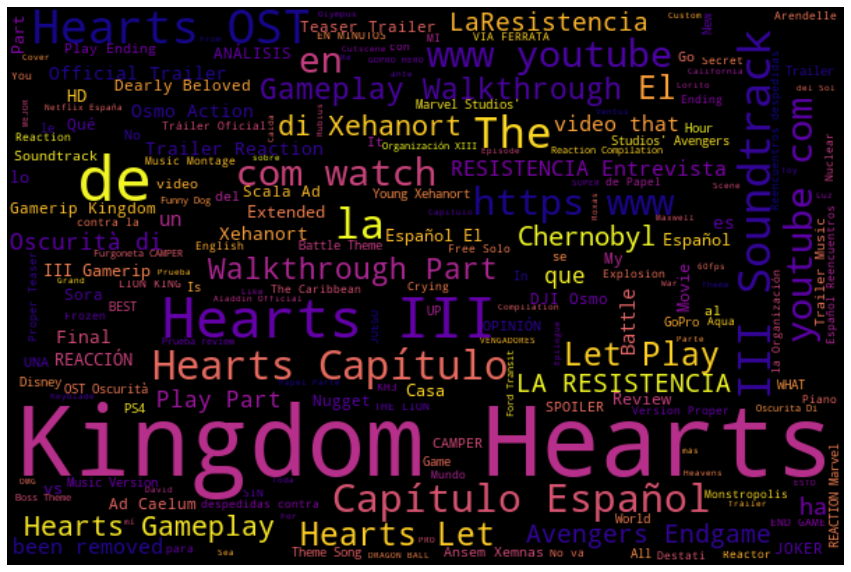



07-2019



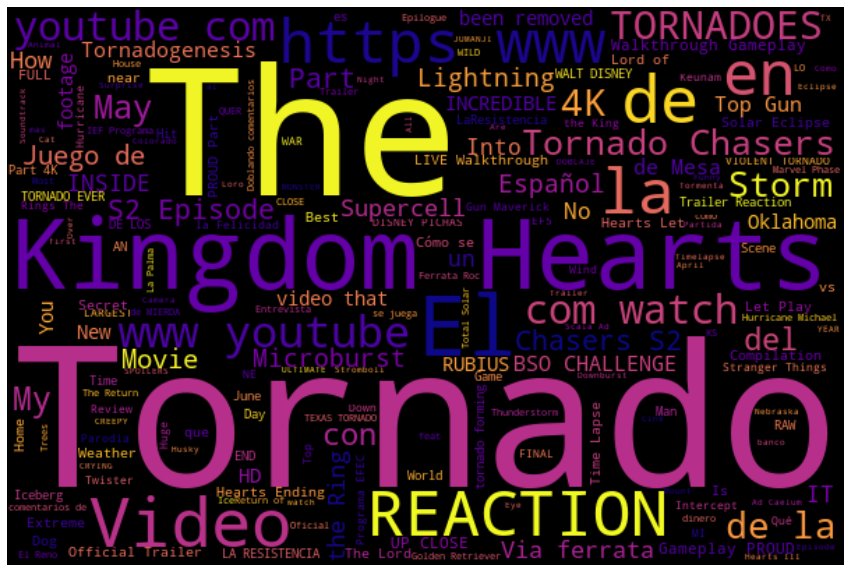



08-2019



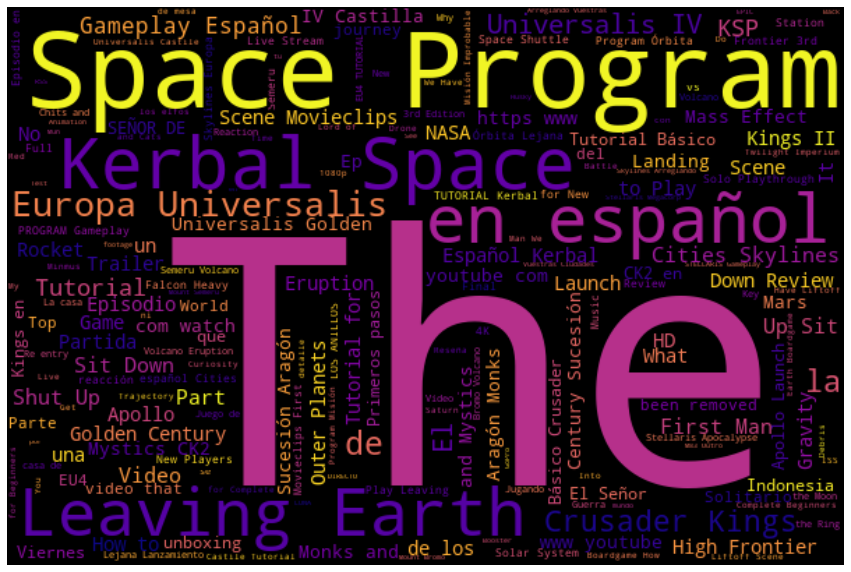



09-2019



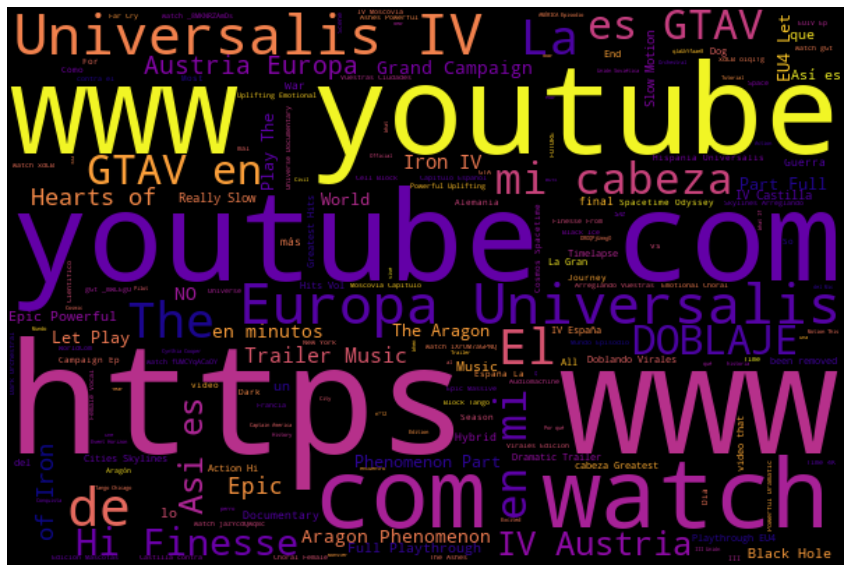



10-2019



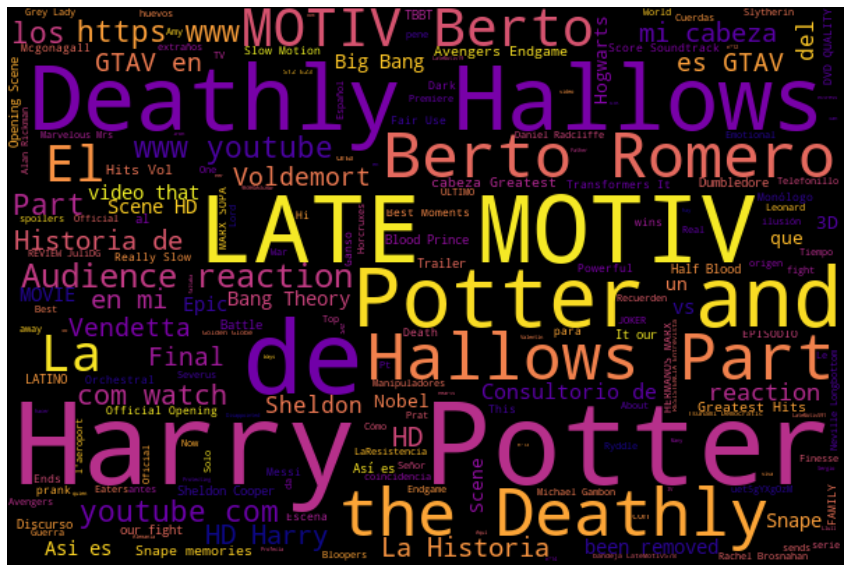



11-2019



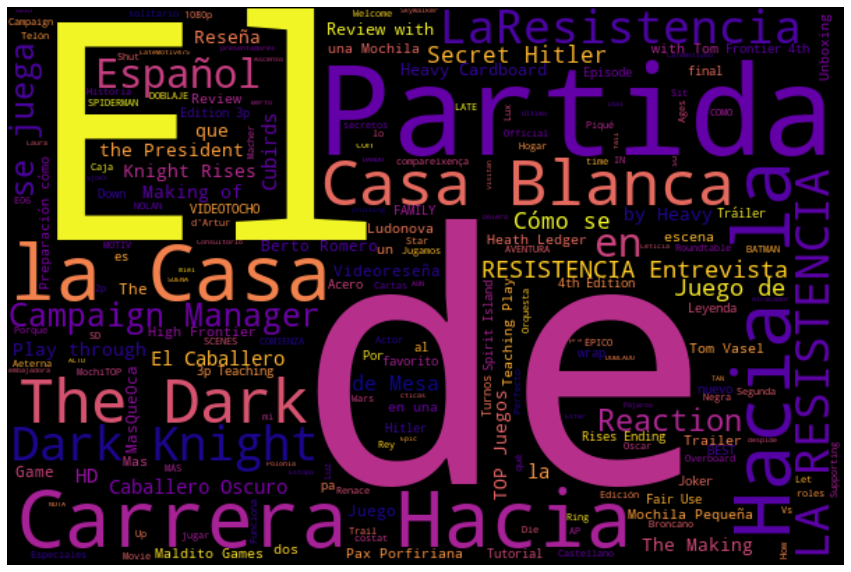



12-2019



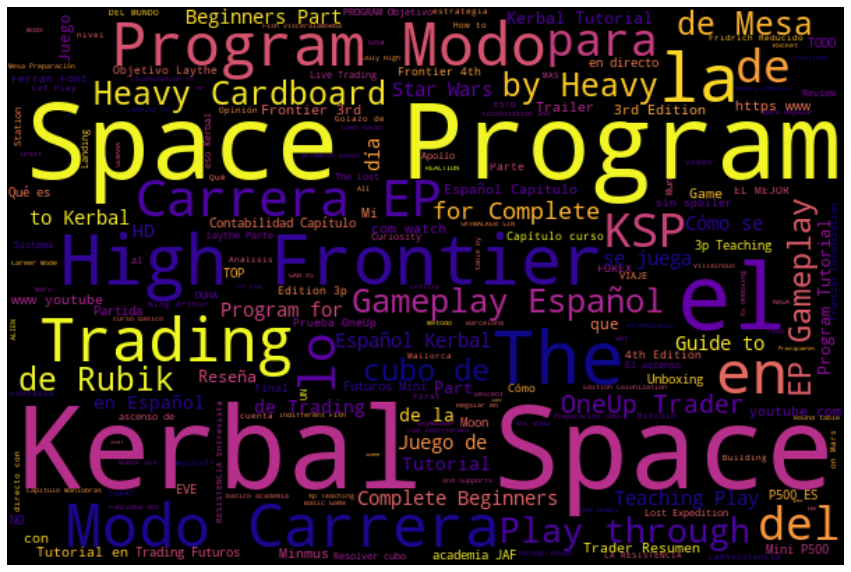



01-2020



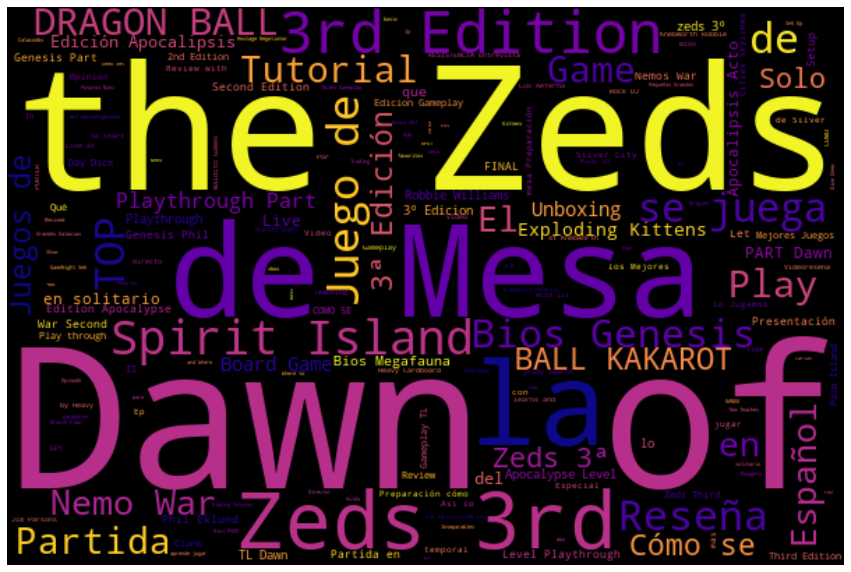



02-2020



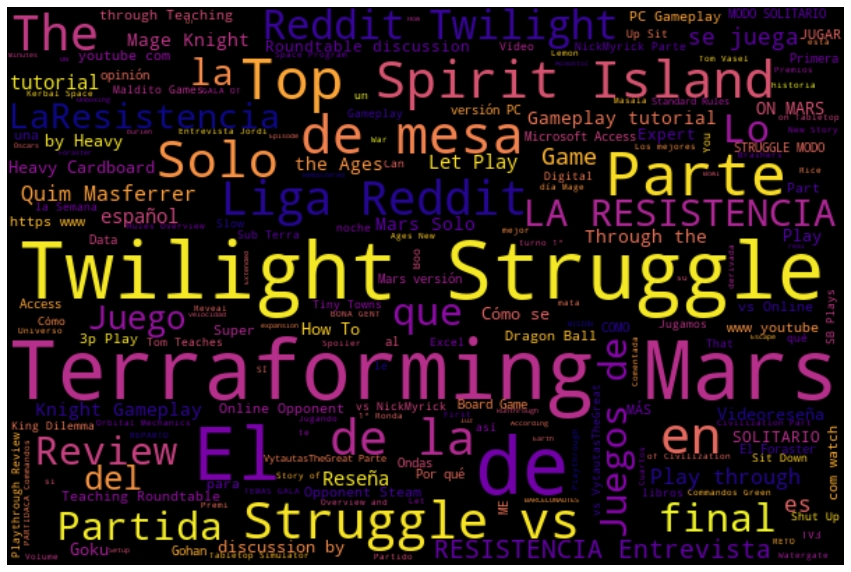



03-2020



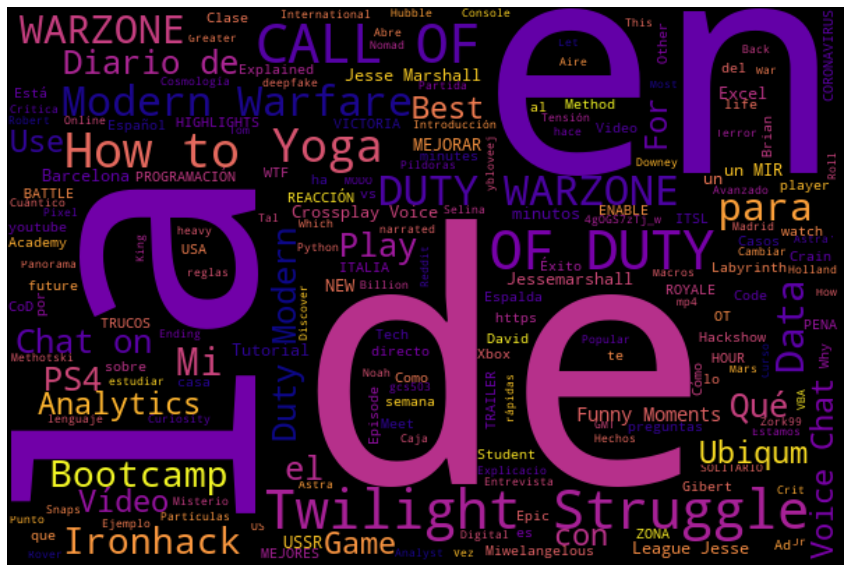



04-2020



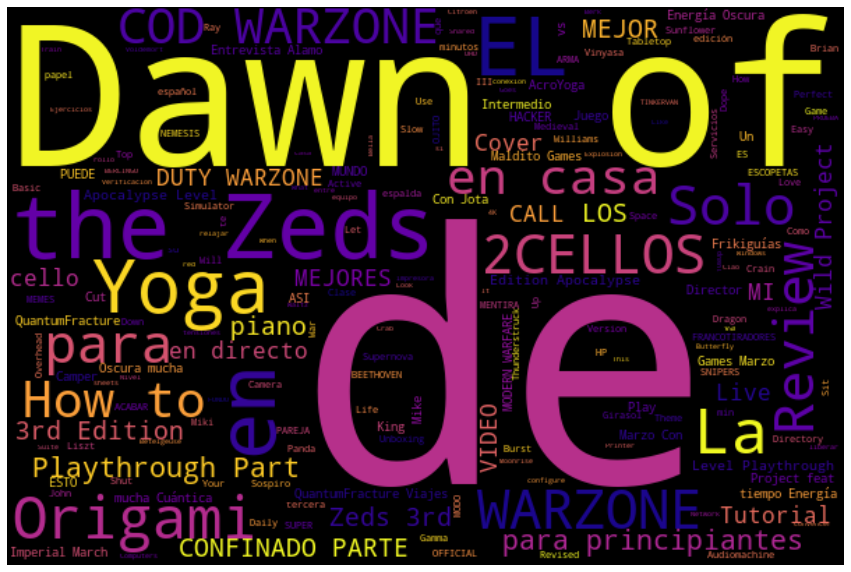



05-2020



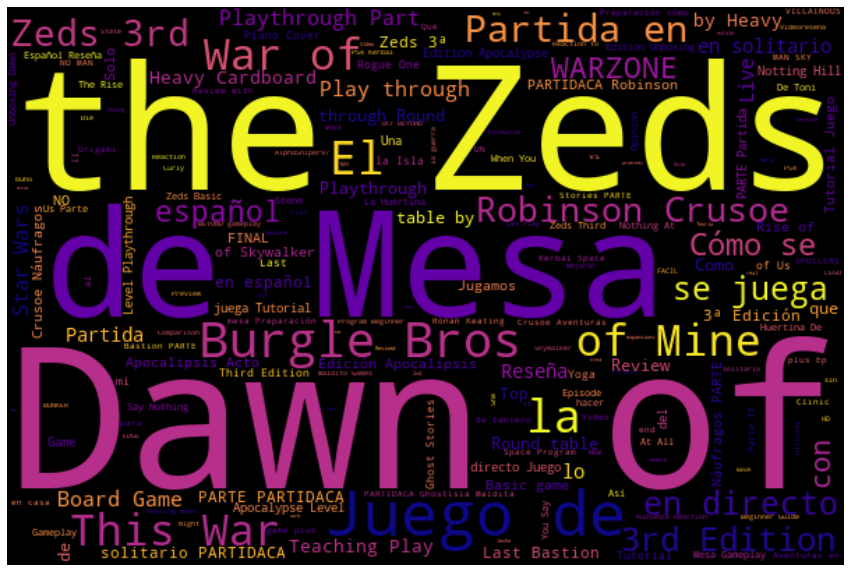



06-2020



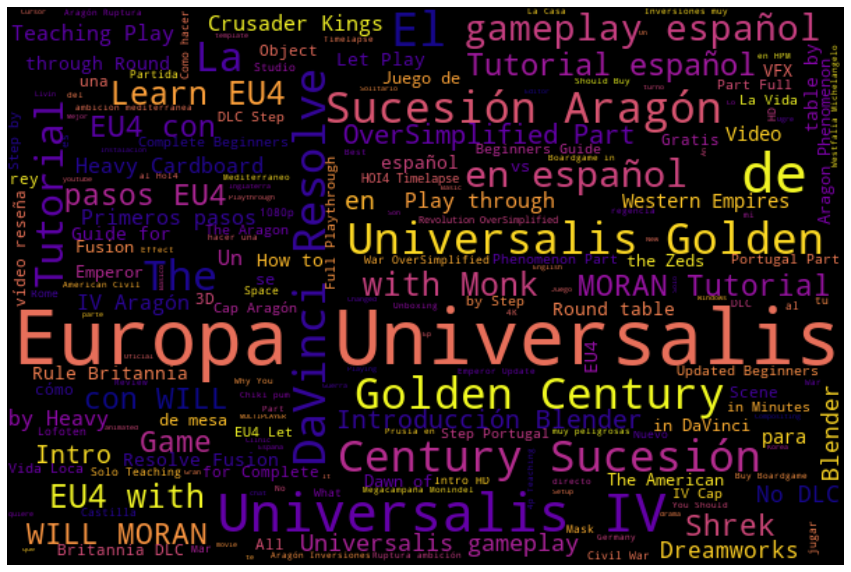



07-2020



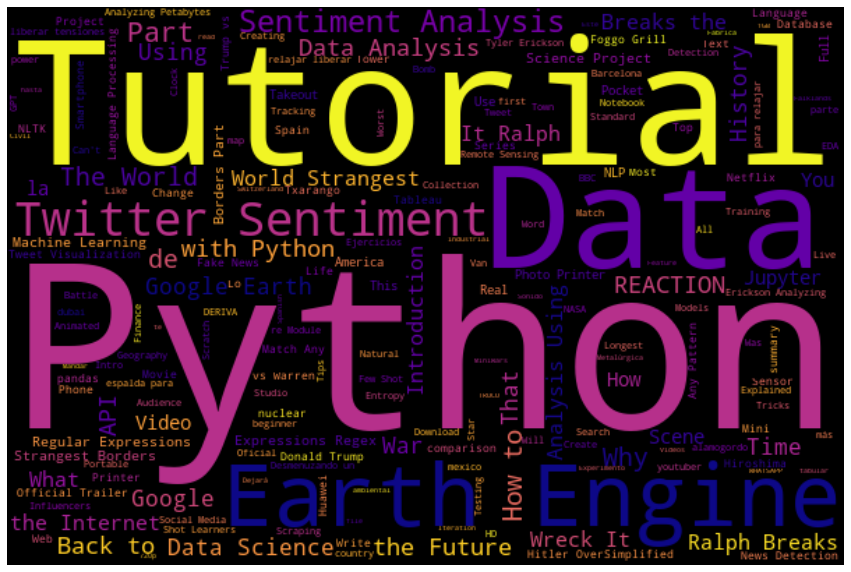

In [9]:
for y,m in iterator_year_month(10,2017,7,2020):
    allWords = ' '.join([content for content in youtube[youtube['time'].apply(lambda x: re.findall(r'^(\d+)-(\d+)', x)[0])==(y,m)]['content']])
    wordCloud = WordCloud(width = 600, height = 400, random_state=21, colormap = 'plasma', max_font_size = 250).generate(allWords)
    fig,ax = plt.subplots(figsize = (15,15))
    plt.imshow(wordCloud, interpolation = "bilinear")
    plt.axis('off')
    plt.margins(x=0, y=0)
    print(str(m) + '-' + str(y) + '\n')
    plt.show()
    print('\n')